## Finding simple patterns using DFT

In [128]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from copy import deepcopy
GREEN = (0, 255, 0)

This cell contains image_to_array function, that converts image from grayscale to RGB

In [129]:
def image_to_array(image) :
    image_array = np.asarray(image)
    return np.array([[(val, val, val) for val in row] for row in image_array])

In [130]:
SCRIPT_PATH = os.getcwd()
IMAGE_DIRECTORY = os.path.join(SCRIPT_PATH, 'images')

In [131]:
def invert(image, pattern, mode = "ceasar") :

    inverted_image = deepcopy(image)
    inverted_pattern = deepcopy(pattern)

    if mode == "ceasar" :
        inverted_image = cv2.bitwise_not(inverted_image)
        inverted_pattern = cv2.bitwise_not(inverted_pattern)
        
    return inverted_image, inverted_pattern

This is cell that loads images using cv2 libary

In [132]:

def load_image(mode = "ceasar") :
    image_name = None
    pattern_name = None

    if mode == "ceasar" :
        image_name = "galia.png"
        pattern_name = "galia_e.png"
    elif mode == "fish" :
        image_name = "school.jpg"
        pattern_name = "fish1.png"
    else :
        raise Exception("Non existing mode")
    
    IMAGE_PATH = os.path.join(IMAGE_DIRECTORY, image_name)
    PATTERN_PATH = os.path.join(IMAGE_DIRECTORY, pattern_name)
    
    image = cv2.imread(IMAGE_PATH, cv2.IMREAD_GRAYSCALE)
    pattern = cv2.imread(PATTERN_PATH, cv2.IMREAD_GRAYSCALE)
    
    return image, pattern

Here are some useful functions for calculating and displaying DFT data

In [133]:
DFT = lambda x : cv2.dft(np.float32(x), flags=cv2.DFT_COMPLEX_OUTPUT)
DFT_shift = lambda x : np.fft.fftshift(x)
MAGNITUDE_spectrum = lambda x : 20 * np.log(cv2.magnitude(x[:, :, 0], x[:, :, 1]))
PHASE_spectrum = lambda x : np.angle(x)
PHASE_display = lambda x, y : x[:,:,y]

In [134]:
def plot_image(image, title, colormap = "gray") :
    plt.figure(figsize=(20, 20))
    plt.plot()
    plt.imshow(image, cmap = colormap)
    plt.title(title)
    plt.axis('off')
    plt.show()

This function tells if given point is local maximum, or if is part of local maximum (more than one point with the same value next to each otner)

In [135]:
def is_maximum(table, x, y, previously_found):
    h, w = table.shape
    val = table[x, y]
    stack = [(x, y)]
    local_max = (x, y)
    
    while stack:
        cx, cy = stack.pop()
        if (cx, cy) in previously_found:
            continue
        previously_found.add((cx, cy))
        neighbors = [
            (i, j) for i in range(max(0, cx - 1), min(cx + 2, h))
                   for j in range(max(0, cy - 1), min(cy + 2, w))
                   if (i, j) not in previously_found
        ]
        for i, j in neighbors:
            if table[i, j] > val:
                return False, None
            if table[i, j] == val:
                stack.append((i, j))
                if (j, i) > (local_max[1], local_max[0]):
                    local_max = (i, j)
                    
    return True, local_max

This function calculates best points to display correlation, and marks them by elypses that contains the pattern

In [136]:
def show_pattern(image, correlation, probability, mark, thickness = 10, color = GREEN, mode = "ceasar") :
    h, w, _ = image.shape
    
    a,b = max(mark), min(mark)
    c = np.sqrt(a**2-b**2)
    d = np.sqrt(b**2 + c**2)
    a_2,b_2 = a + thickness, b + thickness
    c_2 = np.sqrt(a_2**2-b_2**2)
    d_2 = np.sqrt(b_2**2 + c_2**2)
    
    p_h, p_w = mark
    max_points = np.argwhere(correlation > probability)
    
    sorted_indices = np.argsort(correlation[max_points[:, 0], max_points[:, 1]])[::-1]
    max_points = max_points[sorted_indices]
    
    new_points = set()
    # Here we check which points are local maximums for pattern placing to then encircle them
    for x, y in max_points:
        if (x, y) in new_points:
            continue
        boolean, point = is_maximum(correlation, x, y, set())
        if boolean:
            new_points.add(point)
    
    max_points = list(new_points)
    max_points.sort(key=lambda pt: correlation[pt], reverse=True)
    
    appearances = []
    
    for x, y in max_points :
        appearances.append((x - p_h//2, y - p_w//2))
    
    
    def distance(point_a, point_b) :
        return np.sqrt( ( (point_a[0] - point_b[0])**2 ) + ( (point_a[1] - point_b[1])**2 ) )
    
    def is_good(point, centerpoint) :
        nonlocal a, b, c, d, a_2, b_2, c_2, d_2, w, h
        
        if not (0 <= i < h) or not (0 <= j < w) : return False
        
        if distance(point, centerpoint) < min(a, b, a_2, b_2) or distance(point, centerpoint) > max(a, b, a_2, b_2) : return False
        
        o_x, o_y = centerpoint
        A = o_x, o_y + c
        B = o_x, o_y - c
        A_2 = o_x, o_y + c_2
        B_2 = o_x, o_y - c_2
        d_a = distance(point, A)
        d_b = distance(point, B)
        d_2a = distance(point, A_2)
        d_2b = distance(point, B_2)
        
        if d_a + d_b >= 2*min(d, d_2) :
            if d_2a + d_2b <= 2*max(d, d_2) :
                return True
        return False
        
    new_image = deepcopy(image)
    
    k = 1
    for x, y in appearances :
        centerpoint = (x,y)
        k += 1
        for i in range(max(0, x - b_2), min(h, x + b_2)) :
            for j in range(max(0, y - a_2), min(w, y + a_2)) :
                if is_good((i,j), centerpoint) :
                    new_image[i,j] = color
    
    if mode == "ceasar" :
        plot_image(new_image, 'Image with detected pattern appearances of e in Ceasar speech')
    else :
        plot_image(new_image, 'Image with detected pattern appearances of particular fish in the fish school')

This function calculates correlation matrix between image and pattern using Fourier transform delivered by numpy

In [137]:
def find_corelation(image, pattern) :
    h, w = image.shape

    correlation = np.fft.ifft2(np.fft.fft2(image) * np.fft.fft2(np.rot90(np.rot90(pattern)), s = (h, w))).real
    correlation /= np.abs(np.max(correlation))
    return correlation

In [138]:
mode = "fish"
mode2 = "ceasar"
chosen_phase = 1
chosen_phase2 = 0

In [139]:
image, pattern = load_image(mode)
image2, pattern2 = load_image(mode2)

In [140]:
inverted_image, inverted_pattern = invert(image, pattern, mode)
inverted_image2, inverted_pattern2 = invert(image2, pattern2, mode2)

Here is first stage of work - image converted to grayscale


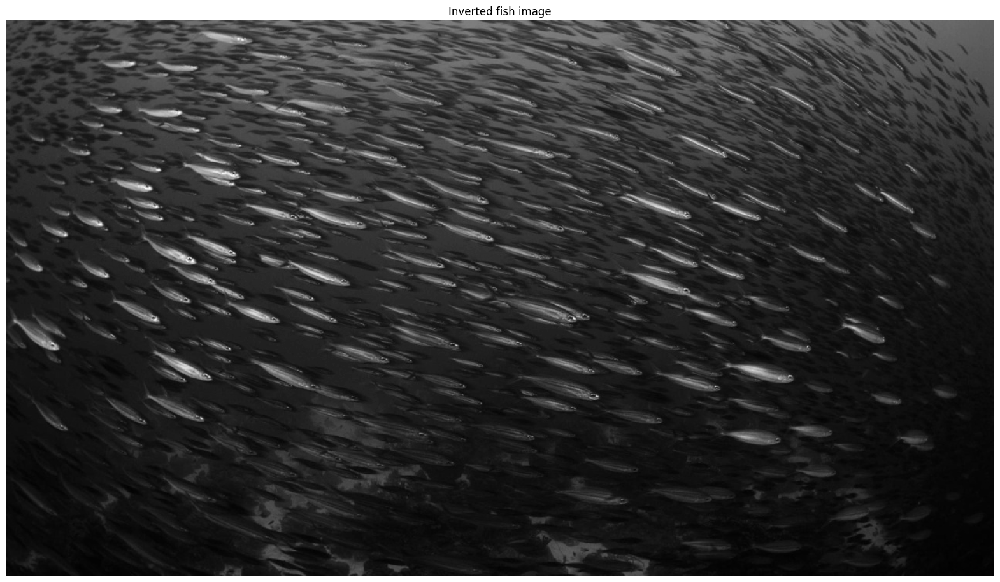

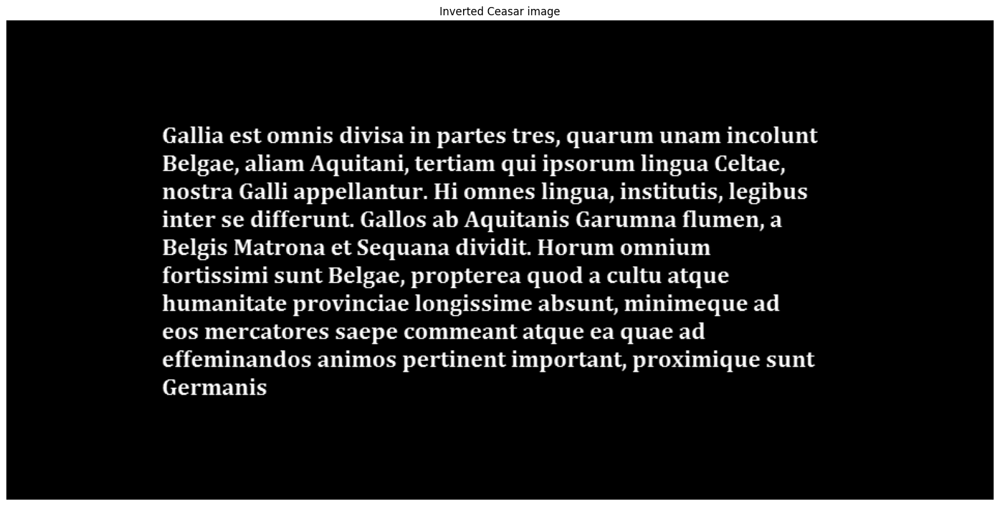

In [141]:
plot_image(inverted_image, "Inverted fish image")
plot_image(inverted_image2, "Inverted Ceasar image")

Next there is pattern that we seeks for

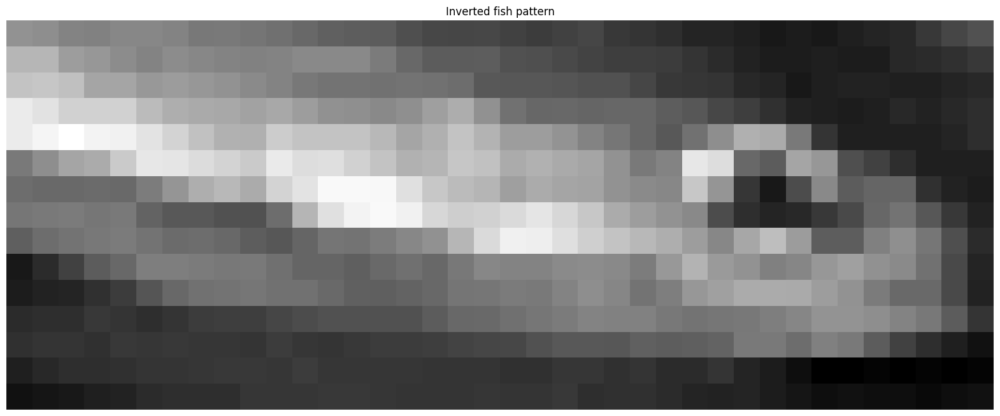

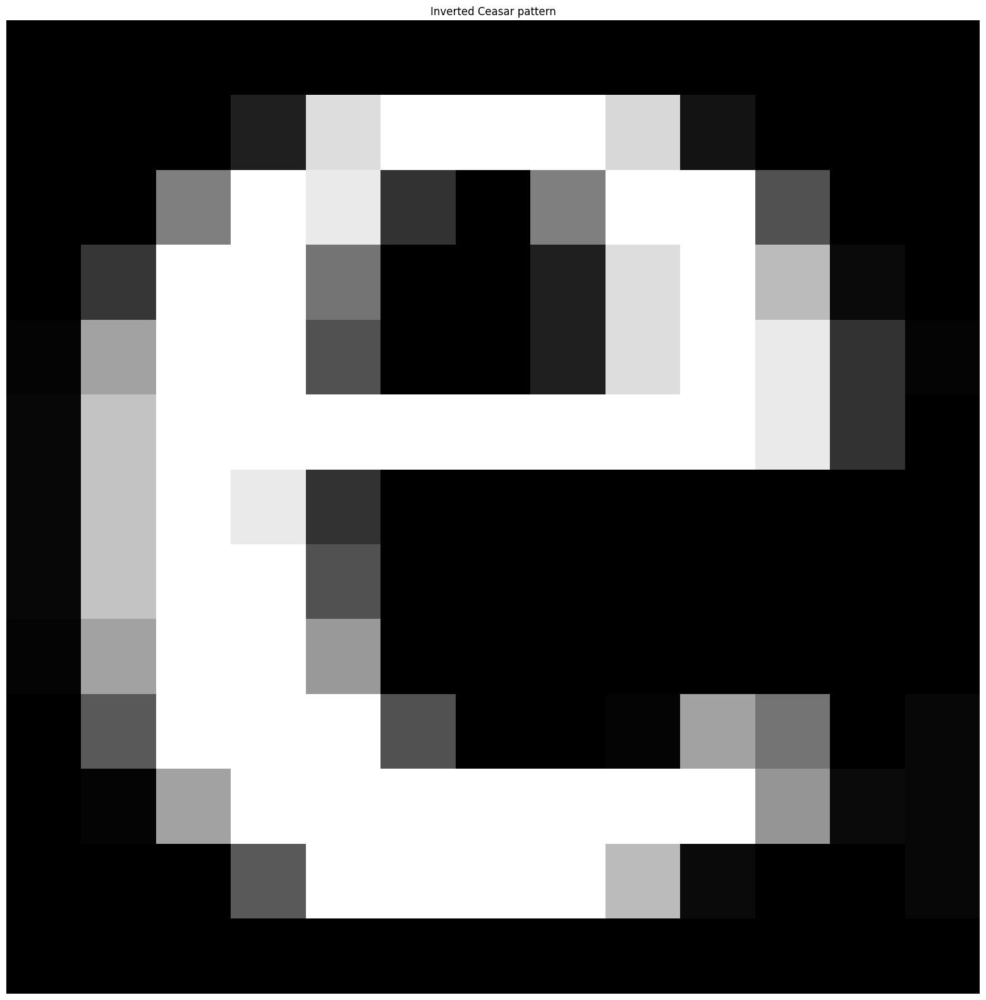

In [142]:
plot_image(inverted_pattern, "Inverted fish pattern")
plot_image(inverted_pattern2, "Inverted Ceasar pattern")

Next we have to calculate DFT for each image. For this and few more steps we will be using lambda functions that we created

In [143]:

dft = DFT(inverted_image)
dft2 = DFT(inverted_image2)


In [144]:
dft_shift = DFT_shift(dft)
dft_shift2 = DFT_shift(dft2)

In [145]:
magnitude_spectrum = MAGNITUDE_spectrum(dft_shift)
magnitude_spectrum2 = MAGNITUDE_spectrum(dft_shift2)

Here are the magnitude spectrums for each image

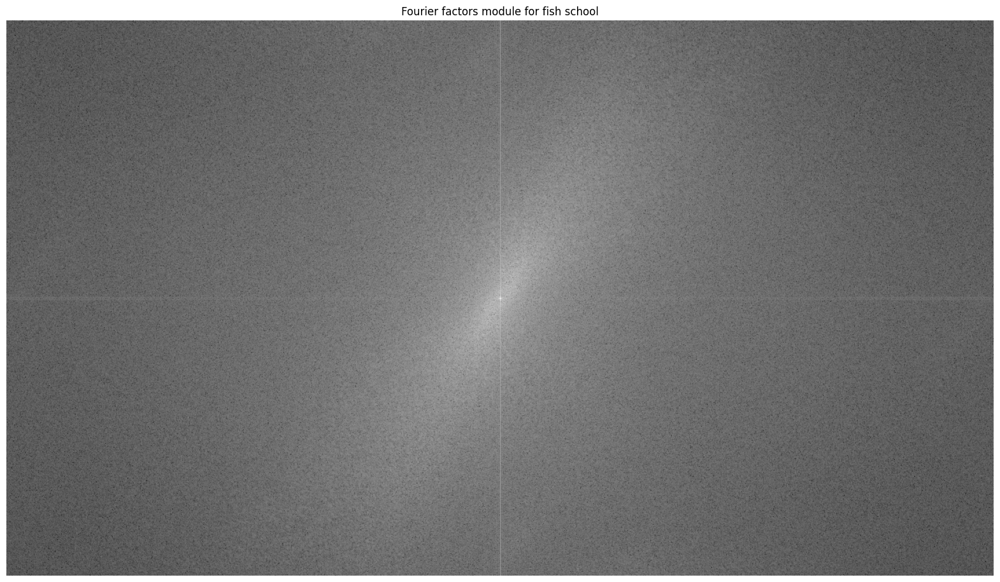

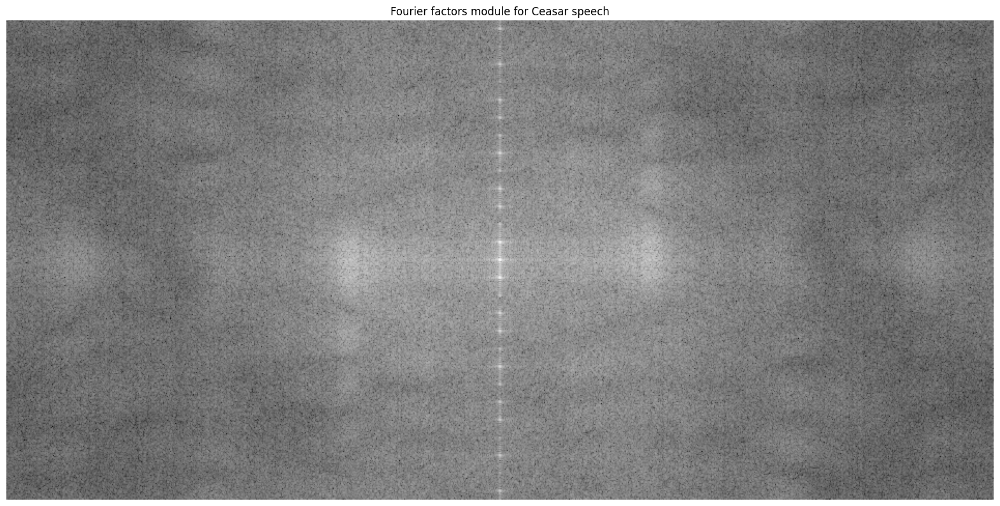

In [146]:
plot_image(magnitude_spectrum, "Fourier factors module for fish school")
plot_image(magnitude_spectrum2, "Fourier factors module for Ceasar speech")

In [147]:
phase_spectrum = PHASE_spectrum(dft_shift)
phase_spectrum2 = PHASE_spectrum(dft_shift2)

In [148]:
phase_to_display = PHASE_display(phase_spectrum, chosen_phase)
phase_to_display2 = PHASE_display(phase_spectrum2, chosen_phase2)

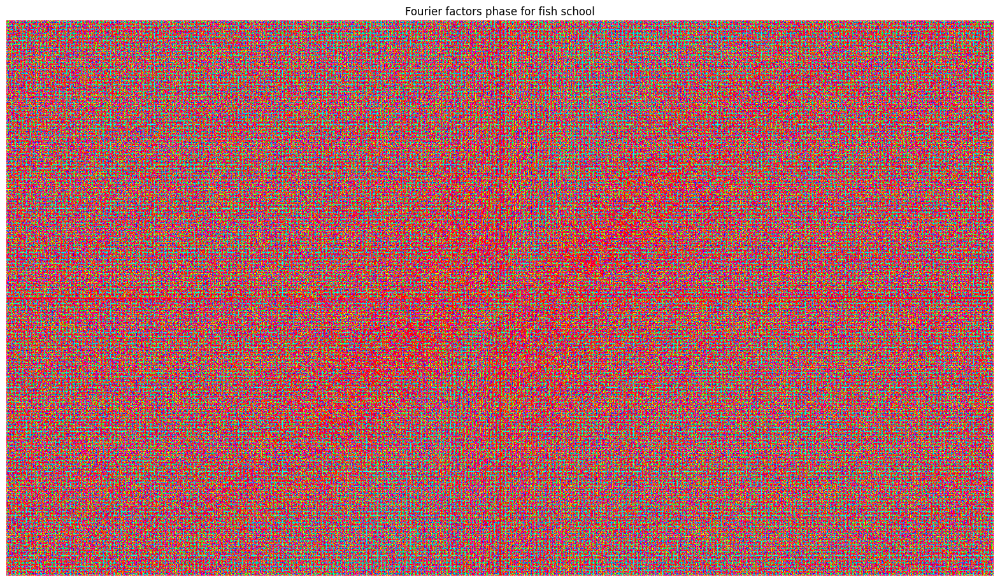

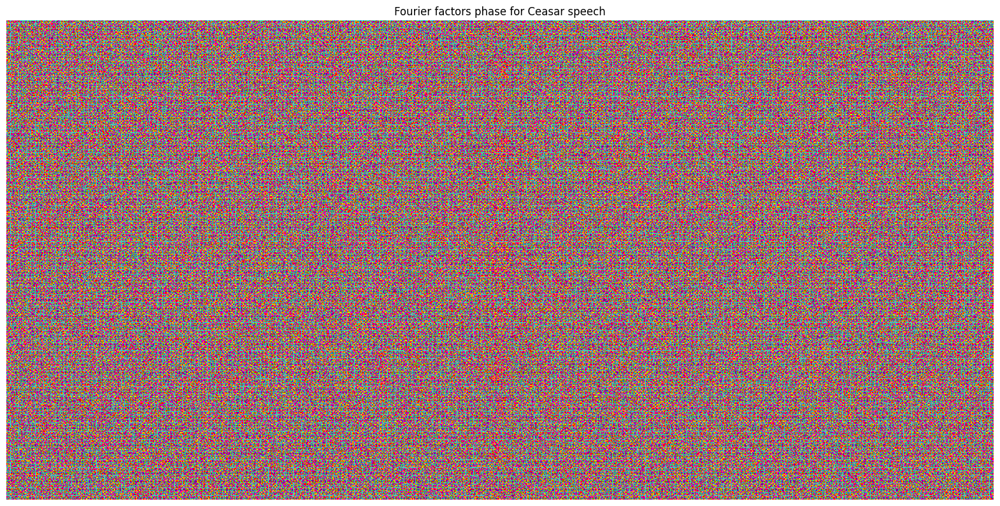

In [149]:
plot_image(phase_to_display, "Fourier factors phase for fish school", "hsv")
plot_image(phase_to_display2, "Fourier factors phase for Ceasar speech", "hsv")

This part is most important, because it calculates the correlation between image and pattern. It will be used to calculate best matching spot for pattern placing

In [150]:
correlation = find_corelation(inverted_image, inverted_pattern)
correlation2 = find_corelation(inverted_image2, inverted_pattern2)

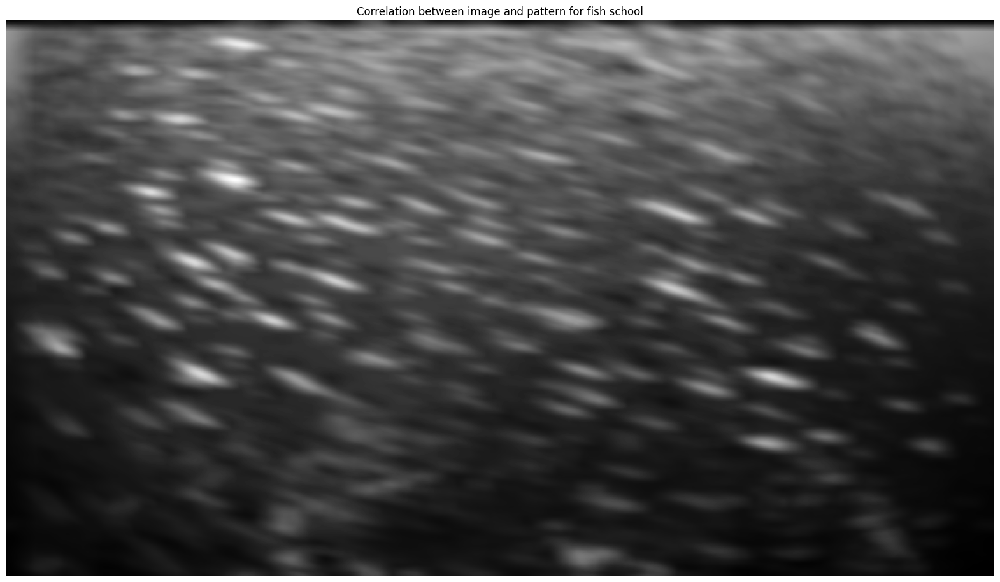

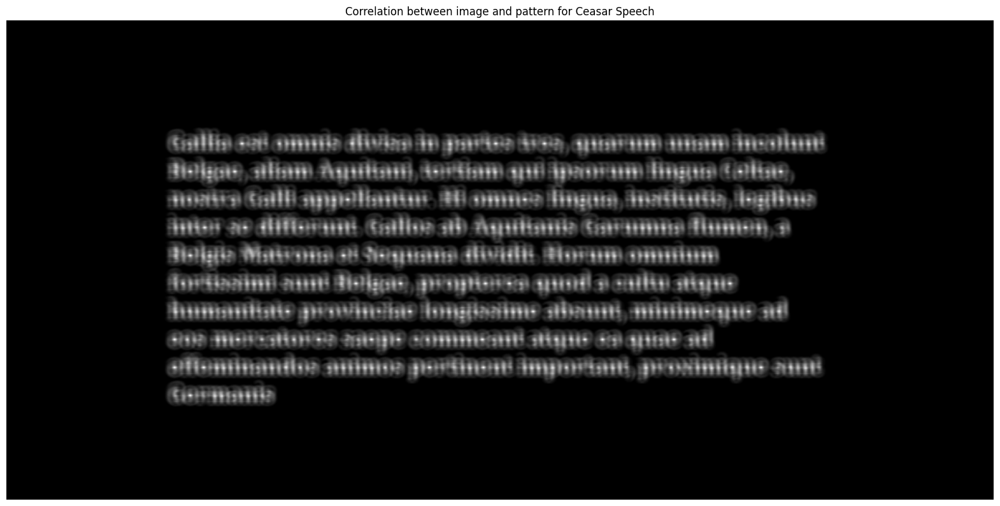

In [151]:
plot_image(correlation, "Correlation between image and pattern for fish school")
plot_image(correlation2, "Correlation between image and pattern for Ceasar Speech")

The last part is to show how we matched pattern to original image by circling the found fragment of image with green ellipses. The probability of acceptance for point was chosen by trial and error method

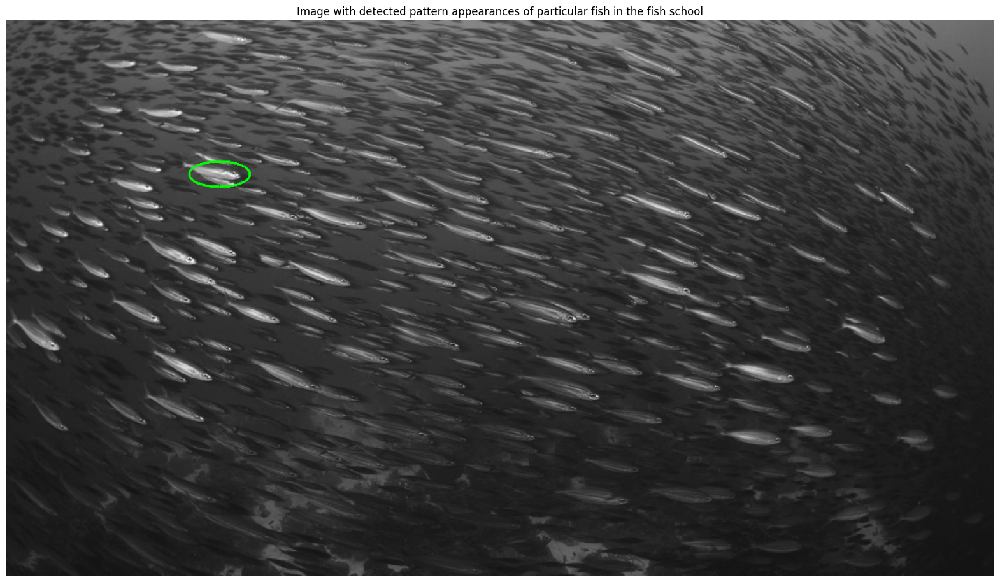

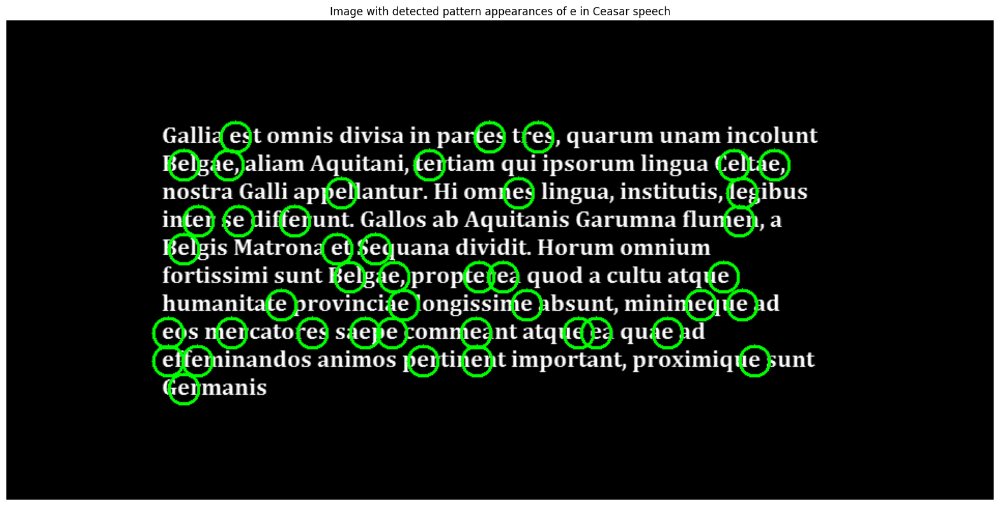

In [152]:
show_pattern(image_to_array(inverted_image), correlation, 0.98, inverted_pattern.shape, thickness = 3, mode = mode)
show_pattern(image_to_array(inverted_image2), correlation2, 0.98, inverted_pattern2.shape, thickness = 3, mode = mode2)